# Attention Inspect

Inspect the trained `attention2` model on each moving-animal attention task. The model is reconstructed from the same base RePL checkpoint and then fully frozen before inference.

Each task figure shows true video frames, PCA-1 over the decoder's predicted spatial-and-channel attention mask, PCA-1 over first-layer activations before and after applying that mask, and class logits across the full sequence with the target class highlighted.

In [1]:
%load_ext autoreload
%autoreload 2

from argparse import Namespace
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from harpl.data.attention_sprites_dataset import (
    ID_TO_TASK,
    MovingAnimalAttentionDataset,
    TASK_TO_ID,
)
from harpl.data.synthetic_sprites_dataset import SpriteVideoDataset
from harpl.scripts.cli_attention import _prepare_arpl_model

plt.rcParams.update({"figure.dpi": 130})


## Configuration

Defaults mirror the W&B run that wrote `checkpoints/attention2`. Edit the paths here if you want to inspect a different attention checkpoint or base RePL model.

In [26]:
DATA_DIR = PROJECT_ROOT / "datasets"
BASE_MODEL_PATH = PROJECT_ROOT / "checkpoints/animals_cts_noiseOnTop0.1_predFULL_1/model_final.pt"
ATTENTION_CHECKPOINT_PATH = PROJECT_ROOT / "checkpoints/att_featspatial_2/attention_model_final.pt"


def spritevideo_normalization_stats(config):
    stats_dataset = SpriteVideoDataset(
        data_dir=config["data_dir"],
        split="train",
        output_size=config["output_size"],
        seq_len=config["seq_len"],
        num_sequences=config["num_sequences"],
        background=config["background"],
        grayscale=False,
        device=config["device"],
        seed=config["seed"],
        max_sprites=config["max_sprites"],
        sprite_img_dir=config["sprite_img_dir"],
        noise_type=config["noise_type"],
        noise_intensity=config["noise_level"],
        freeze_noise=config["freeze_noise"],
        noise_on_top=config["noise_on_top"],
    )
    mean = tuple(float(value) for value in stats_dataset.mean.detach().cpu().reshape(-1).tolist())
    std = tuple(float(value) for value in stats_dataset.std.detach().cpu().reshape(-1).tolist())
    return mean, std


DATASET_CONFIG = dict(
    data_dir=DATA_DIR,
    split="train",
    task="mixed",
    tasks=None,
    output_size=(64, 64),
    base_output_size=(64, 64),
    scale_pixel_parameters=True,
    seq_len=32,
    num_sequences=64,
    sprite_img_dir="animals",
    max_sprites=8,
    seed=47,
    background=0.5,
    device="cpu",
    noise_type="gaussian",
    noise_level=0.1,
    training_noise_level=0.1,
    object_recognition_noise_level=0.35,
    object_recognition_matches_pretraining=True,
    freeze_noise=False,
    noise_on_top=True,
    popout_mode="class",
    num_distractors=2,
    crowd_size=3,
    cue_frames=5,
    occluder_count=0,
    occluder_min_size=8,
    occluder_max_size=18,
    fixation_size=4.0,
    scale_range=(0.2, 1.0),
    velocity_range=(-8.0, 8.0),
    scale_velocity_range=(-0.125, 0.125),
    slow_speed_range=(1.0, 3.0),
    fast_speed_range=(7.0, 8.0),
    angular_speed_range=(-30.0, 30.0),
    slow_rotation_speed_range=(5.0, 15.0),
    fast_rotation_speed_range=(25.0, 30.0),
    velocity_popout_kind="fast",
    rotation_popout_kind="fast",
    normalize=True,
    mean=None,
    std=None,
    return_metadata=False,
)
DATASET_CONFIG["mean"], DATASET_CONFIG["std"] = spritevideo_normalization_stats(DATASET_CONFIG)

MODEL_CONFIG = dict(
    model_path=str(BASE_MODEL_PATH),
    batch_size=1,
    num_workers=0,
    pin_memory=False,
    persistent_workers=False,
    prefetch_factor=None,
    grayscale=False,
    flatten_images=False,
    return_full_features=None,
    attention_hidden_dim=None,
    # attention_decoder_layers=2,
    attention_dims="features+spatial",
    attention_conv2d_decoder=True,
    attention_readout_path=None,
    attention_use_task_embedding=False,
    attention_class_prompt_value=10.0,
    encoder="conv2d",
    use_bn=True,
    enc_n_layers=6,
    enc_kernel_size=[(5, 5)] * 6,
    enc_stride=[(2, 2), (2, 2), (1, 1), (1, 1), (1, 1), (1, 1)],
    enc_padding=[(2, 2)] * 6,
    enc_pool_size=None,
    enc_output_dim=32,
    flatten_enc_output=True,
    integrator="lstm",
    ctx_dim=512,
    ctx_n_layers=1,
    predictor="mlp",
    pred_n_hidden_layers=1,
    pred_hidden_dim=512,
    pred_steps=1,
    prediction_target="enc",
    pred_target_dim_override=0,
    dense_prediction=False,
)

def make_model_args(dataset_config, model_config):
    cfg = dict(model_config)
    cfg.update(
        seed=dataset_config["seed"],
        data_input_dir=str(dataset_config["data_dir"]),
        sprite_img_dir=dataset_config["sprite_img_dir"],
        spritevid_max_sprites=dataset_config["max_sprites"],
        spritevid_output_size=list(dataset_config["output_size"]),
        spritevid_noise_type=dataset_config["noise_type"],
        spritevid_noise_level=dataset_config["noise_level"],
        spritevid_frozen_noise=dataset_config["freeze_noise"],
        sprite_noise_on_top=dataset_config["noise_on_top"],
        spritevid_device=dataset_config["device"],
        seq_len=dataset_config["seq_len"],
        num_sequences=dataset_config["num_sequences"],
        attention_task=dataset_config["task"],
        attention_tasks=dataset_config["tasks"],
        attention_base_output_size=list(dataset_config["base_output_size"]),
        attention_scale_pixel_parameters=dataset_config["scale_pixel_parameters"],
        attention_background=dataset_config["background"],
        attention_object_recognition_matches_pretraining=dataset_config["object_recognition_matches_pretraining"],
        attention_normalize=dataset_config["normalize"],
        attention_mean=dataset_config["mean"],
        attention_std=dataset_config["std"],
        popout_mode=dataset_config["popout_mode"],
        num_distractors=dataset_config["num_distractors"],
        crowd_size=dataset_config["crowd_size"],
        cue_frames=dataset_config["cue_frames"],
    )
    return Namespace(**cfg)

DEVICE = torch.device(
    "mps" if torch.backends.mps.is_available()
    else "cuda" if torch.cuda.is_available()
    else "cpu"
)
DEVICE


Computing normalization values using 10000 samples...
Computed normalization values - mean: tensor([0.4997, 0.4949, 0.4936]), std: tensor([0.1241, 0.1196, 0.1217])


device(type='mps')

In [27]:
args = make_model_args(DATASET_CONFIG, MODEL_CONFIG)
model_dataset = MovingAnimalAttentionDataset(**DATASET_CONFIG)

model = _prepare_arpl_model(args, model_dataset, DEVICE)
state_dict = torch.load(ATTENTION_CHECKPOINT_PATH, map_location=DEVICE)
try:
    model.load_state_dict(state_dict, strict=True)
except RuntimeError as exc:
    raise RuntimeError(
        f"{ATTENTION_CHECKPOINT_PATH} is incompatible with the current spatial attention decoder. "
        "Retrain the attention model so the decoder checkpoint contains full (C,H,W) masks."
    ) from exc
model.eval()
for param in model.parameters():
    param.requires_grad_(False)

n_total = sum(p.numel() for p in model.parameters())
n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"loaded {ATTENTION_CHECKPOINT_PATH}")
print(f"device={DEVICE}, total_params={n_total:,}, trainable_params={n_trainable:,}")

loaded /Users/matushalak/Documents/harpl/checkpoints/att_featspatial_2/attention_model_final.pt
device=mps, total_params=22,603,592, trainable_params=0


## Inspection helpers

The learned attention is a full spatial-and-channel mask at the first encoder block. The attention row visualizes only the decoder output by projecting the full per-frame `(C,H,W)` mask to PCA-1; the following PCA rows show the first-layer activations before and after that mask is applied.

In [28]:
def frame_to_image(video_t, dataset_config=DATASET_CONFIG):
    frame = video_t.detach().cpu()
    if dataset_config.get("normalize", False):
        mean = torch.as_tensor(dataset_config["mean"], dtype=frame.dtype).view(-1, 1, 1)
        std = torch.as_tensor(dataset_config["std"], dtype=frame.dtype).view(-1, 1, 1)
        frame = frame * std + mean
    image = frame.permute(1, 2, 0).numpy()
    return np.clip(image, 0.0, 1.0)


def normalize_map(x, vmin=None, vmax=None, eps=1e-8):
    x = np.asarray(x, dtype=np.float32)
    if vmin is None:
        vmin = np.nanpercentile(x, 2)
    if vmax is None:
        vmax = np.nanpercentile(x, 98)
    return np.clip((x - vmin) / (vmax - vmin + eps), 0.0, 1.0)


def pca_first_component_maps(features):
    # features: (L, C, H, W). PCA is fit over all time-space samples for this tensor.
    arr = features.detach().float().cpu().numpy()
    L, C, H, W = arr.shape
    matrix = arr.transpose(0, 2, 3, 1).reshape(L * H * W, C)
    matrix = matrix - matrix.mean(axis=0, keepdims=True)
    if not np.isfinite(matrix).all() or np.allclose(matrix, 0):
        return np.zeros((L, H, W), dtype=np.float32)
    _, s, vh = np.linalg.svd(matrix, full_matrices=False)
    scores = matrix @ vh[0]
    # Make the sign deterministic for easier comparison across tasks.
    if np.abs(scores.min()) > np.abs(scores.max()):
        scores = -scores
    maps = scores.reshape(L, H, W)
    return normalize_map(maps)


def upsample_feature_maps(maps, size):
    tensor = torch.as_tensor(maps, dtype=torch.float32).unsqueeze(1)
    tensor = F.interpolate(tensor, size=size, mode="bilinear", align_corners=False)
    return tensor.squeeze(1).numpy()


def class_name(dataset, class_id):
    class_id = int(class_id)
    if 0 <= class_id < len(dataset.class_names):
        return f"{class_id}: {dataset.class_names[class_id]}"
    return str(class_id)


In [29]:
@torch.no_grad()
def inspect_forward(model, video, task_info):
    video = video.unsqueeze(0).to(DEVICE)
    task_info = task_info.unsqueeze(0).to(DEVICE, dtype=torch.long)

    if hasattr(model.integrator, "hidden"):
        model.integrator.hidden = None

    data = video
    if model.preprocess is not None:
        data, _ = model.preprocess(data)

    p_t = model._initial_decoder_state(data, use_attention=True)
    integrator_hidden_t = getattr(model.integrator, "hidden", None)

    logits, attentions, before, after = [], [], [], []
    for t in range(data.size(1)):
        data_t = data[:, t:t + 1]
        decoder_input_t = model._decoder_input(p_t, task_info)

        z0_t = model._forward_encoder_first(data_t)
        a0_t = model._format_attention(model.decoder(decoder_input_t), z0_t)
        z0_att_t = z0_t * a0_t
        z_t = model._forward_encoder_tail(z0_att_t)
        if model.postprocess is not None:
            z_t = model.postprocess(z_t)

        c_t, integrator_hidden_t = model.integrator_step(z_t, integrator_hidden_t)
        k_t = model.head(c_t)
        p_t = model.predictor_step(c_t, task_info, True, k_t)

        logits.append(k_t[0, 0].detach().cpu())
        attentions.append(a0_t[0, 0].detach().cpu())
        before.append(z0_t[0, 0].detach().cpu())
        after.append(z0_att_t[0, 0].detach().cpu())

    return {
        "logits": torch.stack(logits),
        "attention": torch.stack(attentions),
        "first_before": torch.stack(before),
        "first_after": torch.stack(after),
    }


def pca_attention_mask_maps(attention, frame_size):
    # New spatial decoder: attention is (L, C, H, W), so PCA is fit over all time-space mask samples.
    # The 2-D branch is retained only to make old channel-only checkpoints obvious in inspection output.
    if attention.ndim == 4:
        return upsample_feature_maps(pca_first_component_maps(attention), frame_size)
    if attention.ndim != 2:
        raise ValueError(f"Expected attention shaped (L,C,H,W) or legacy (L,C), got {tuple(attention.shape)}")
    matrix = attention.detach().float().cpu().numpy()
    matrix = matrix - matrix.mean(axis=0, keepdims=True)
    if not np.isfinite(matrix).all() or np.allclose(matrix, 0):
        scores = np.zeros(matrix.shape[0], dtype=np.float32)
    else:
        _, _, vh = np.linalg.svd(matrix, full_matrices=False)
        scores = matrix @ vh[0]
        if np.abs(scores.min()) > np.abs(scores.max()):
            scores = -scores
    scores = normalize_map(scores)
    height, width = frame_size
    return np.broadcast_to(scores[:, None, None], (scores.shape[0], height, width)).copy()


In [30]:
def make_task_dataset(task, *, seed, popout_mode="class", num_sequences=16):
    config = dict(DATASET_CONFIG)
    config.update(
        task=task,
        seed=seed,
        popout_mode=popout_mode,
        num_sequences=num_sequences,
        return_metadata=True,
    )
    return MovingAnimalAttentionDataset(**config)


TASK_SPECS = [
    dict(task="object_recognition", seed=407, popout_mode="class"),
    dict(task="popout", seed=4210, popout_mode="class"),
    dict(task="tracking", seed=4220, popout_mode="class"),
    dict(task="top_down_search", seed=4230, popout_mode="class"),
    dict(task="perceptual_grouping", seed=4240, popout_mode="class"),
]

FRAME_IDS = tuple(range(0, DATASET_CONFIG["seq_len"], 4))

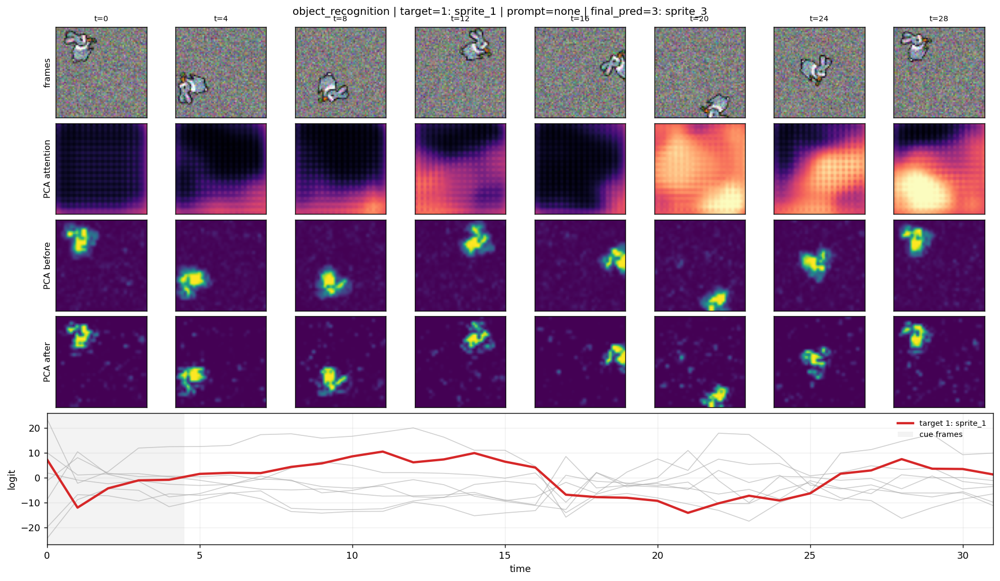

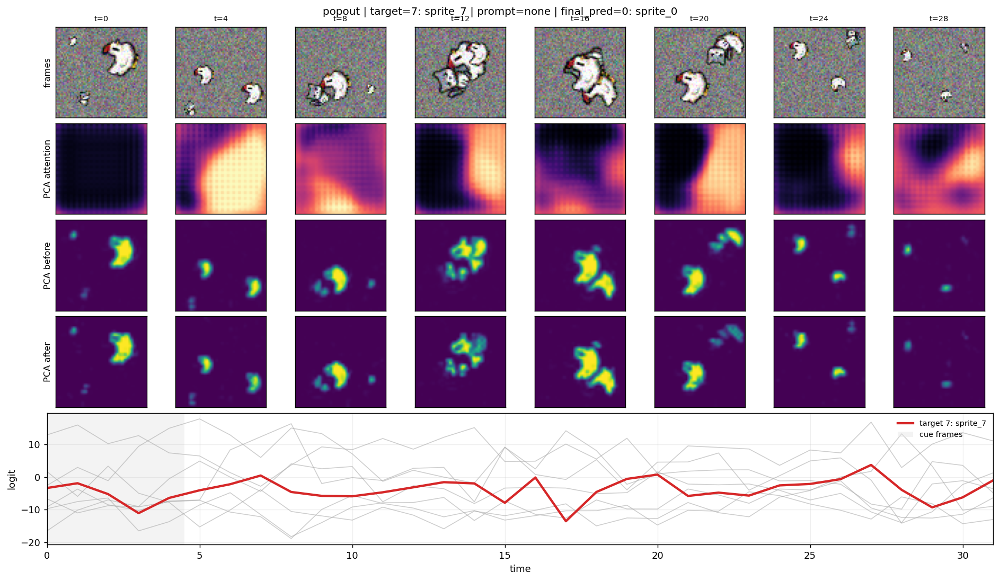

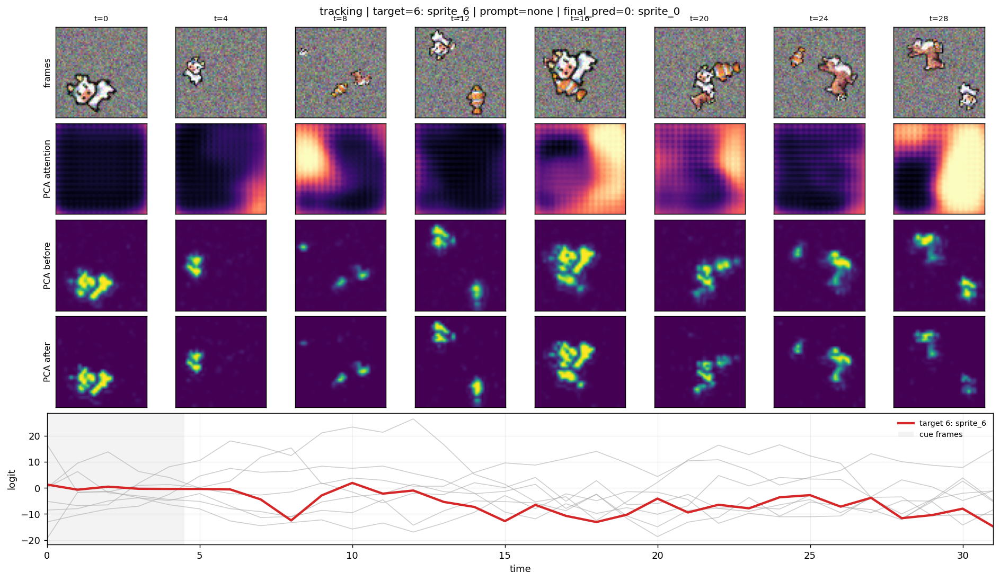

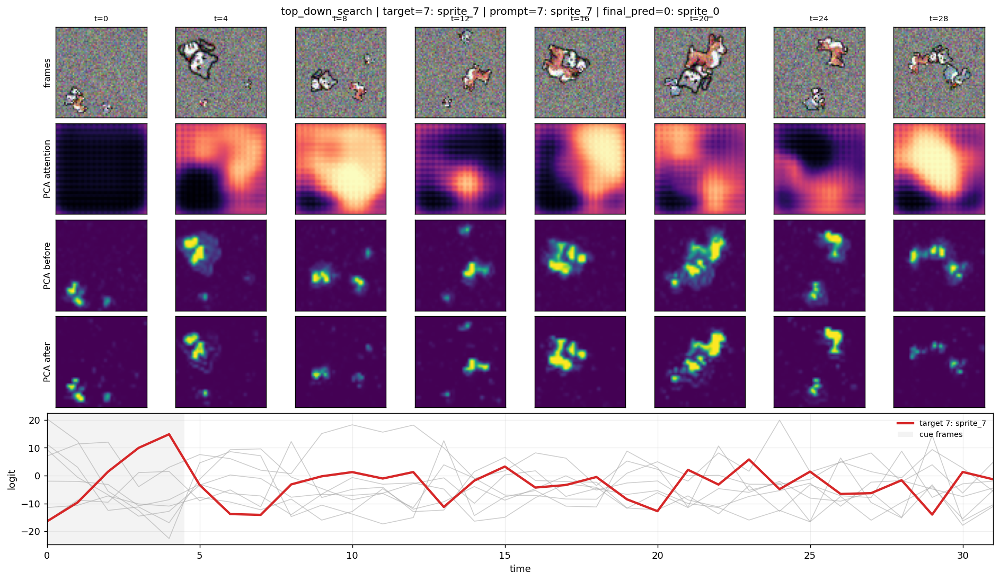

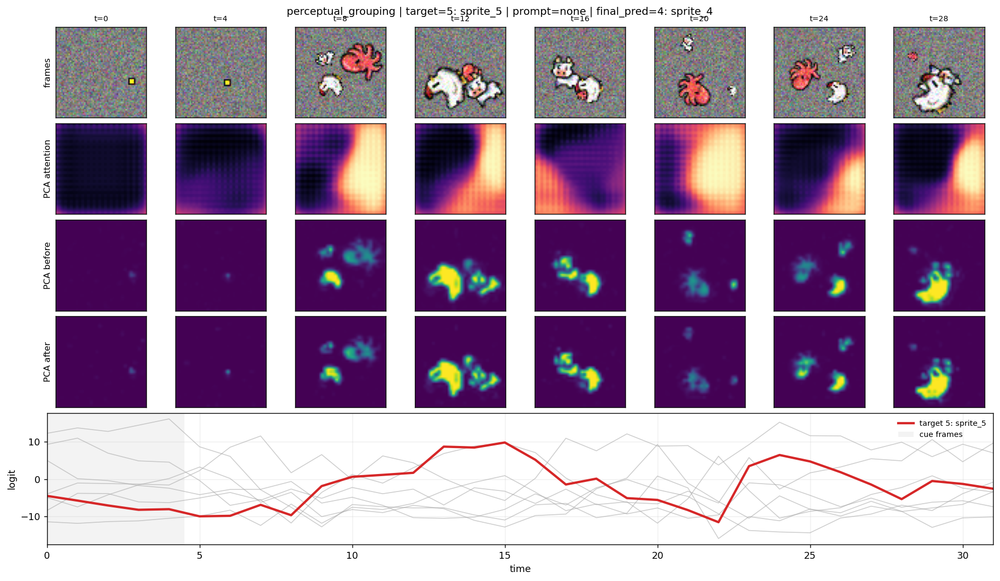

In [31]:
def plot_task_inspection(task_spec, sample_index=0, frame_ids=FRAME_IDS):
    dataset = make_task_dataset(**task_spec)
    video, labels = dataset[sample_index]
    task_info = labels["task_info"]
    target_class = int(labels["target_class"])
    result = inspect_forward(model, video, task_info)

    frame_size = tuple(video.shape[-2:])
    attention_maps = pca_attention_mask_maps(result["attention"], frame_size)
    pca_before = upsample_feature_maps(pca_first_component_maps(result["first_before"]), frame_size)
    pca_after = upsample_feature_maps(pca_first_component_maps(result["first_after"]), frame_size)
    logits = result["logits"].numpy()
    times = np.arange(logits.shape[0])

    ncols = len(frame_ids)
    fig = plt.figure(figsize=(1.8 * ncols, 8.2), constrained_layout=True)
    gs = fig.add_gridspec(5, ncols, height_ratios=[1, 1, 1, 1, 1.45])

    row_labels = [
        "frames",
        "PCA attention",
        "PCA before",
        "PCA after",
    ]
    row_data = [
        [frame_to_image(video[t]) for t in frame_ids],
        [attention_maps[t] for t in frame_ids],
        [pca_before[t] for t in frame_ids],
        [pca_after[t] for t in frame_ids],
    ]
    cmaps = [None, "magma", "viridis", "viridis"]

    for r, (label, images, cmap) in enumerate(zip(row_labels, row_data, cmaps)):
        for c, (t, image) in enumerate(zip(frame_ids, images)):
            ax = fig.add_subplot(gs[r, c])
            if cmap is None:
                ax.imshow(image)
            else:
                ax.imshow(image, cmap=cmap, vmin=0, vmax=1)
            ax.set_xticks([])
            ax.set_yticks([])
            if r == 0:
                ax.set_title(f"t={t}", fontsize=8)
            if c == 0:
                ax.set_ylabel(label, fontsize=9)

    ax = fig.add_subplot(gs[4, :])
    for class_id in range(logits.shape[1]):
        if class_id == target_class:
            continue
        ax.plot(times, logits[:, class_id], color="0.65", lw=0.9, alpha=0.55)
    ax.plot(times, logits[:, target_class], color="#d62728", lw=2.4, label=f"target {class_name(dataset, target_class)}")
    cue_frames = int(labels["cue_frames"])
    ax.axvspan(-0.5, cue_frames - 0.5, color="0.9", alpha=0.45, lw=0, label="cue frames")
    ax.set_xlim(0, logits.shape[0] - 1)
    ax.set_xlabel("time")
    ax.set_ylabel("logit")
    ax.legend(loc="upper right", fontsize=8, frameon=False)
    ax.grid(alpha=0.2)

    predicted = int(logits[-1].argmax())
    prompt = int(labels["prompt_class"])
    title = (
        f"{labels['task']} | target={class_name(dataset, target_class)} | "
        f"prompt={class_name(dataset, prompt) if prompt >= 0 else 'none'} | "
        f"final_pred={class_name(dataset, predicted)}"
    )
    fig.suptitle(title, y=1.01, fontsize=11)
    return fig, result, labels


figures = []
for spec in TASK_SPECS:
    fig, result, labels = plot_task_inspection(spec)
    figures.append(fig)
    plt.show()

## Optional: inspect pop-out subtypes

The trained model was configured with `popout_mode="class"`. This optional cell is useful if you also want to probe rotation- and velocity-defined pop-out stimuli with the same frozen model.

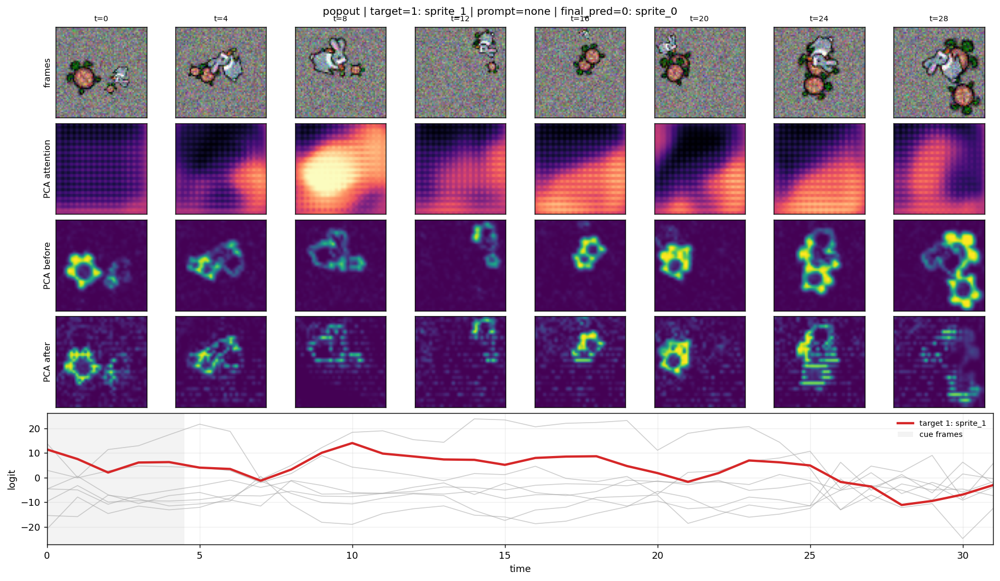

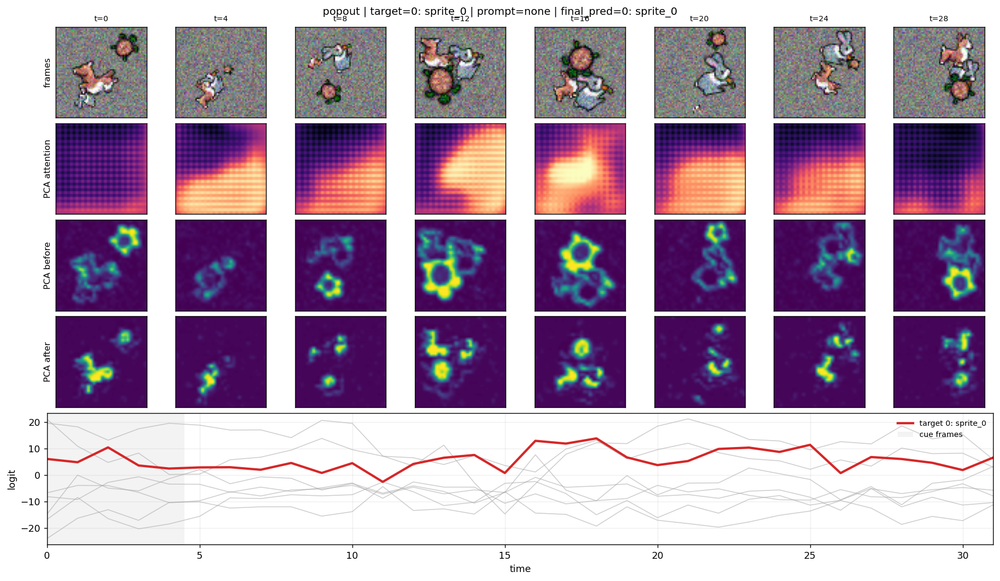

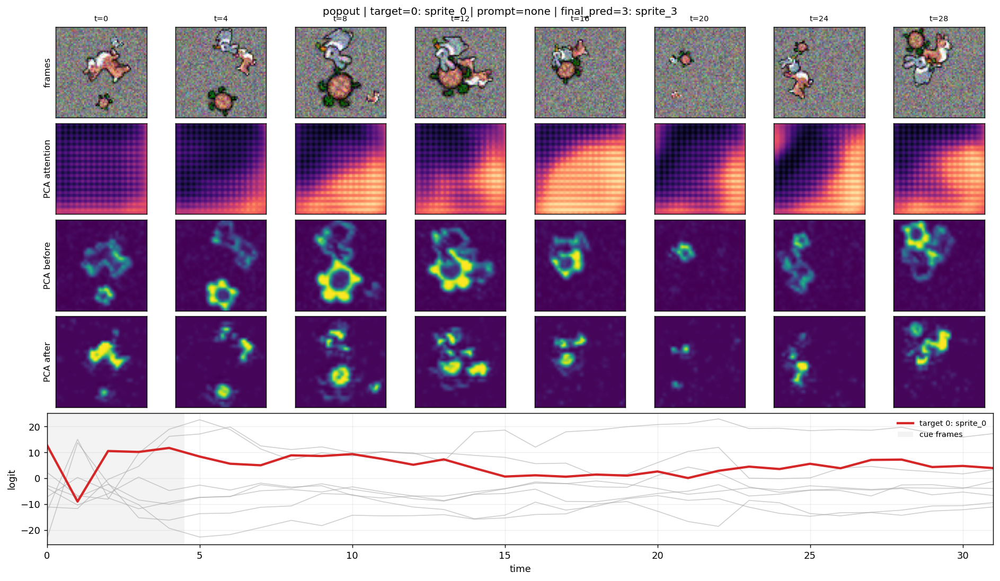

In [11]:
for mode in ["class", "rotation", "velocity"]:
    fig, result, labels = plot_task_inspection(dict(task="popout", seed=4300, popout_mode=mode))
    plt.show()